## GAN training on the CelebA dataset for image generation 

In this notebook we are going to get familiar with training a GAN model on the [CelebA dataset](https://mmlab.ie.cuhk.edu.hk/projects/CelebA.html). After running the notebook as it is, you are invited to use the same notebook to train a model on your custom dataset. 

The architecture of this generative model is specifically that of a DCGAN. DCGANs are GANs that explicitly use convolutional and convolutional-transpose layers in the discriminator and generator networks, respectively. DCGANs were first described in [this 2015 paper](https://arxiv.org/pdf/1511.06434.pdf). You can read about DCGANs in [PyTorch Tutorial page](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html) which is also the reference point for this notebook.

##### Loading our dataset

Before you start your training, you need to download the CelebA dataset or whichever dataset you wish to test the model on, and move it into the `datasets` folder.

Important notes:

- You only need to download and move the files around once! Comment out the following two cells after making sure that you have your training dataset in the correct directory.

- The long codename that you will see below, is the ID of the [google drive link to the dataset](https://drive.usercontent.google.com/download?id=1O7m1010EJjLE5QxLZiM9Fpjs7Oj6e684&authuser=0). If you struggle with the following two code cells, feel free to use the [link](https://drive.usercontent.google.com/download?id=1O7m1010EJjLE5QxLZiM9Fpjs7Oj6e684&authuser=0) to manually download the zip file, then extract the data and move the folder into the correct directory. 

In [1]:
!gdown 1O7m1010EJjLE5QxLZiM9Fpjs7Oj6e684 

Downloading...
From (original): https://drive.google.com/uc?id=1O7m1010EJjLE5QxLZiM9Fpjs7Oj6e684
From (redirected): https://drive.google.com/uc?id=1O7m1010EJjLE5QxLZiM9Fpjs7Oj6e684&confirm=t&uuid=40adf3d4-69ac-4ce0-968a-77bf65903565
To: /Users/irini/Documents/GitHub/DMLAP-2024-PREP/python/06-gans/img_align_celeba.zip
100%|██████████████████████████████████████| 1.44G/1.44G [04:17<00:00, 5.62MB/s]


In [2]:
# *** for MAC and Linux OS ***
# !unzip img_align_celeba.zip            # unzip dataset
# !mv img_align_celeba ./datasets/celeba # move the unzipped dataset in the designated directory
# !rm img_align_celeba.zip               # remove the zip file from this directory
# !rm -rf __MACOSX                       # remove all hidden unnecessary files starting with _MACOSX

# *** for Windows OS ***
# !tar -xf img_align_celeba.zip                   # unzip dataset
# !robocopy img_align_celeba ./datasets/celeba /E # copy and paste unzipped dataset to the designated directory 
# !del img_align_celeba.zip                       # delete the zip file from this directory
# !rmdir /s /q img_align_celeba                   # delete the entire directory tree without confirmation

Archive:  img_align_celeba.zip
   creating: img_align_celeba/
 extracting: img_align_celeba/000001.jpg  
 extracting: img_align_celeba/000002.jpg  
 extracting: img_align_celeba/000003.jpg  
 extracting: img_align_celeba/000004.jpg  
 extracting: img_align_celeba/000005.jpg  
 extracting: img_align_celeba/000006.jpg  
 extracting: img_align_celeba/000007.jpg  
 extracting: img_align_celeba/000008.jpg  
 extracting: img_align_celeba/000009.jpg  
 extracting: img_align_celeba/000010.jpg  
 extracting: img_align_celeba/000011.jpg  
 extracting: img_align_celeba/000012.jpg  
 extracting: img_align_celeba/000013.jpg  
 extracting: img_align_celeba/000014.jpg  
 extracting: img_align_celeba/000015.jpg  
 extracting: img_align_celeba/000016.jpg  
 extracting: img_align_celeba/000017.jpg  
 extracting: img_align_celeba/000018.jpg  
 extracting: img_align_celeba/000019.jpg  
 extracting: img_align_celeba/000020.jpg  
 extracting: img_align_celeba/000021.jpg  
 extracting: img_align_celeba/00002

##### Imports

Let's do some imports:

In [3]:
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torchvision.utils as vutils
from torch.utils.data import DataLoader
import torchvision.datasets as datasets
from torchvision.utils import make_grid
import torchvision.transforms as transforms

import numpy as np

##### Hypermaparameters

In [7]:
learn_rate = 2e-4  
batch_size = 128
img_size = 64
img_channels = 3
num_epochs = 2

feat_discr = 64 # number of feature maps for discriminator
feat_gen = 64   # number of feature maps for generator
z_dim = 100     # size of z latent vector (i.e. size of generator input)

# root directory for dataset
dataroot = 'datasets/celeba/'

# starting from scratch or continuing an older training?
new_training = True
# path to existing model if you wish to continue training
load_path = 'models/model-0.pt'
# path to new model
save_path = 'models/model-1.pt'

##### Device

`cuda` (gpu)

`cpu`  (not gpu)

`mps`  (Mac M1/M2) 

In [8]:
# check if mps is available? macOS 12.3+
print(torch.backends.mps.is_available())

# ****try chaning 'cpu' to 'mps' if using mac M1/M2, may speed up things****
device = 'cuda' if torch.cuda.is_available() else 'mps' 
device

True


'mps'

##### Image transformations

In [9]:
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.CenterCrop(img_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# create the dataset
dataset = datasets.ImageFolder(root=dataroot, transform=transform)
# create the dataloader
dataloader = DataLoader(dataset=dataset, batch_size=batch_size, shuffle=True)

##### Plot some training images

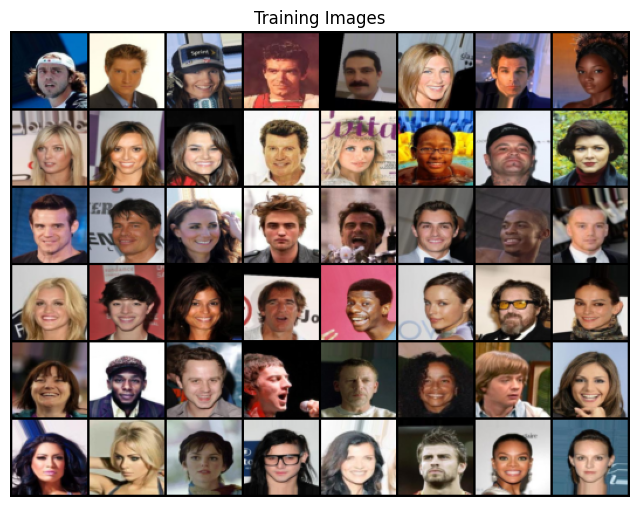

In [10]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:48], padding=2, normalize=True).cpu(),(1,2,0)))

##### GAN Architecture

In the following two cells, we define the architecture of the generator and discriminator network, respectively:

In [11]:
class Generator(nn.Module):
    def __init__(self, z_dim, img_channels, features_g):
        super(Generator, self).__init__()

        self.conv1 = nn.ConvTranspose2d(z_dim, features_g * 8, kernel_size=4, stride=1, padding=0, bias=False)
        self.conv2 = nn.ConvTranspose2d( features_g * 8, features_g * 4, 4, 2, 1, bias=False)
        self.conv3 = nn.ConvTranspose2d( features_g * 4, features_g * 2, 4, 2, 1, bias=False)
        self.conv4 = nn.ConvTranspose2d( features_g * 2, features_g, 4, 2, 1, bias=False)
        self.conv5 = nn.ConvTranspose2d( features_g, img_channels, 4, 2, 1, bias=False)

        self.bn1 = nn.BatchNorm2d(features_g * 8)
        self.bn2 = nn.BatchNorm2d(features_g * 4)
        self.bn3 = nn.BatchNorm2d(features_g * 2)
        self.bn4 = nn.BatchNorm2d(features_g)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.bn1(x)
        x = F.relu(self.conv2(x))
        x = self.bn2(x)
        x = F.relu(self.conv3(x))
        x = self.bn3(x)
        x = F.relu(self.conv4(x))
        x = self.bn4(x)
        x = F.tanh(self.conv5(x))
        return x

In [12]:
class Discriminator(nn.Module):
    def __init__(self, img_channels, features_d):
        super(Discriminator, self).__init__()

        self.conv1 = nn.Conv2d(img_channels, features_d, kernel_size=4, stride=2, padding=1, bias=False)
        self.conv2 = nn.Conv2d(features_d, features_d * 2, 4, 2, 1, bias=False)
        self.conv3 = nn.Conv2d(features_d * 2, features_d * 4, 4, 2, 1, bias=False)
        self.conv4 = nn.Conv2d(features_d * 4, features_d * 8, 4, 2, 1, bias=False)
        self.conv5 = nn.Conv2d(features_d * 8, 1, 4, 1, 0, bias=False)

        self.bn1 = nn.BatchNorm2d(features_d * 2)
        self.bn2 = nn.BatchNorm2d(features_d * 4)
        self.bn3 = nn.BatchNorm2d(features_d * 8)

    def forward(self, x):
        x = F.leaky_relu(self.conv1(x))
        x = F.leaky_relu(self.conv2(x))
        x = self.bn1(x)
        x = F.leaky_relu(self.conv3(x))
        x = self.bn2(x)
        x = F.leaky_relu(self.conv4(x))
        x = self.bn3(x)
        x = F.sigmoid(self.conv5(x))
        return x

##### Weights' initialition

In [13]:
def initialize_weights(model):
    classname = model.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(model.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(model.weight.data, 1.0, 0.02)
        nn.init.constant_(model.bias.data, 0)

##### Setup G and D Networks

In the following two cells, we setup the core objects of our networks (weights, loss function, optimisation algorithm).

In [14]:
gen = Generator(z_dim, img_channels, feat_gen).to(device)
disc = Discriminator(img_channels, feat_discr).to(device)

# You may start with the random initialisation of weights,
# but if you wish to continue your training from a certain checkpoint, 
# you can load your saved model, i.e. weights, from that checkpoint
# and proceed from there.
# Change tour `new_training` boolean accordingly in the hyperparameters
if new_training == False:
    checkpoint = torch.load(load_path, map_location=torch.device(device))
    gen.load_state_dict(checkpoint['generator'])
    disc.load_state_dict(checkpoint['discriminator'])
else:
    gen.apply(initialize_weights)
    disc.apply(initialize_weights)

print(gen)
print(disc)

Generator(
  (conv1): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (conv2): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (conv3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (conv4): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (conv5): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
)
Discriminator(
  (conv1): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (conv2): Conv2d(64, 128, kernel_size=(4, 4)

In [15]:
# initialise the binary cross entropy loss function
criterion = nn.BCELoss()

# create batch of latent vectors that we will use to visualise
# the progression of the generator
fixed_noise = torch.randn(32, z_dim, 1, 1, device=device)

# establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# setup Adam optimisers for both G and D
opt_gen = optim.Adam(gen.parameters(), lr=learn_rate, betas=(0.5, 0.999))
opt_disc = optim.Adam(disc.parameters(), lr=learn_rate, betas=(0.5, 0.999))



##### Draw one grid of images per batch

In [16]:
def show_tensor_images(image_tensor, num_images=32, size=(1, 64, 64)):
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=4)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

##### Training loop

Epoch [0/2] Batch 0/1583                   Loss D: 0.2080, loss G: 3.7272


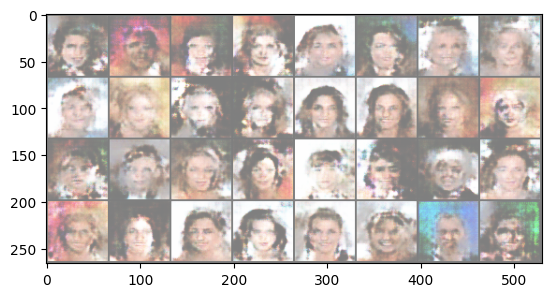

Epoch [0/2] Batch 50/1583                   Loss D: 0.6414, loss G: 6.8908


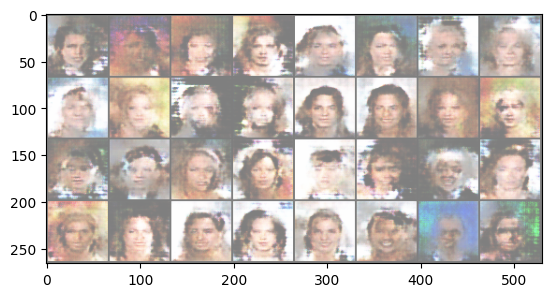

Epoch [0/2] Batch 100/1583                   Loss D: 0.4034, loss G: 3.3541


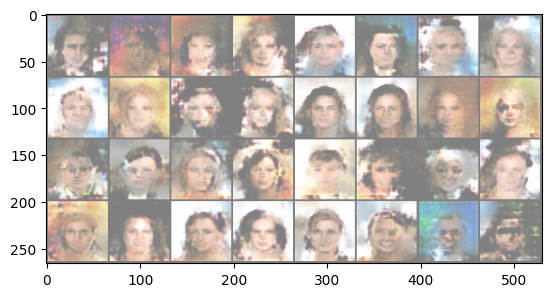

KeyboardInterrupt: 

In [17]:
# lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

# for each epoch
for epoch in range(num_epochs):
    for batch_idx, (real_data, _ ) in enumerate(dataloader):
       
        # our dataloader returns the image data and the associated class labels '_' that we ignore
        # batch of REAL DATA
        real_data = real_data.to(device)

        # generate batch of FAKE DATA
        noise = torch.randn((batch_size, z_dim, 1, 1)).to(device)
        fake_data = gen(noise)

        ###################################
        #### D I S C R I M I N A T O R ####
        ###################################

        # TRAIN WITH A BATCH OF REAL DATA
        # clear gradients of discriminator
        disc.zero_grad()
        # for the number of data in the real batch, create a real label 1
        real_data_size = real_data.size(0)
        label = torch.full((real_data_size,), real_label, dtype=torch.float, device=device)
        # forward pass real batch through the discriminator
        output = disc(real_data).squeeze()
        # calculate loss on real batch
        errD_real = criterion(output, label)
        # calculate gradients for discriminator in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        # TRAIN WITH A BATCH OF FAKE DATA
        # for the fake data that we generated through the generator - see above discriminator
        # add a fake label
        label.fill_(fake_label)
        # classify all fake batch with discriminator
        output = disc(fake_data.detach()).squeeze()
        # calculate loss on fake batch
        errD_fake = criterion(output, label)
        # calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
       
        # compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # update the weights of the discriminator network only
        opt_disc.step()

        ###########################
        #### G E N E R A T O R ####
        ###########################

        # clear gradients of generator
        gen.zero_grad()

        # take fake images and pass through
        # fake labels are real for generator cost
        label.fill_(real_label) 
        output = disc(fake_data).squeeze()
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        
        # update generator weights only
        opt_gen.step()

        ############################################
        #### T R A C K I N G    P R O G R E S S ####
        ############################################

        # print losses and fake images occasionally
        if batch_idx % 50 == 0:
            print(
                f"Epoch [{epoch}/{num_epochs}] Batch {batch_idx}/{len(dataloader)} \
                  Loss D: {errD:.4f}, loss G: {errG:.4f}"
            )
            with torch.no_grad():
                fake_data = gen(fixed_noise)
                img_grid_real = torchvision.utils.make_grid(real_data[:32], normalize=True)
                img_grid_fake = torchvision.utils.make_grid(fake_data[:32], normalize=True)
                show_tensor_images(img_grid_fake)
                # Save Losses for plotting later
      
        # save losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

##### Plot losses

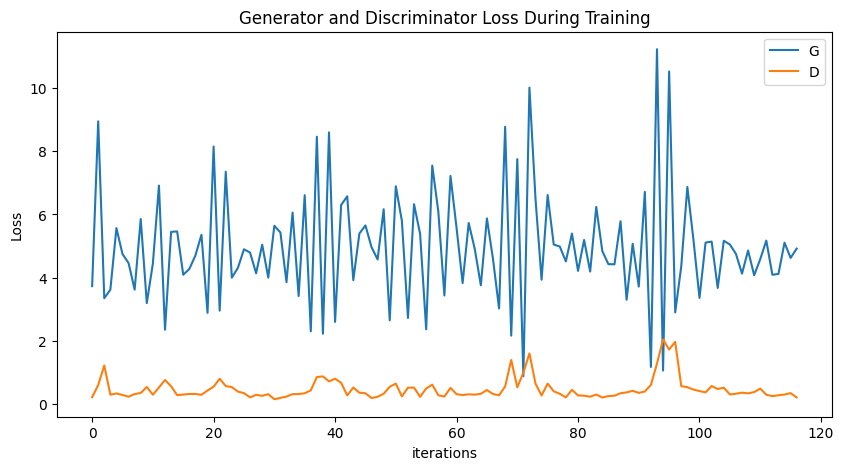

In [18]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

##### Save model

In [19]:
# save model weights
model = {}
model['generator'] = gen.state_dict()
model['discriminator'] = disc.state_dict()
torch.save(model, save_path)